# **Image to image translation using CGAN**
based on this [paper](https://arxiv.org/pdf/1611.07004.pdf)

## Introduction

Many problems in image processing, computer graphics,
and computer vision can be posed as “translating” an input
image into a corresponding output image. Just as a concept
may be expressed in either English or French, a scene may
be rendered as an RGB image, a gradient field, an edge map,
a semantic label map, etc. In analogy to automatic language
translation, we define automatic image-to-image translation
as the task of translating one possible representation of a
scene into another, given sufficient training data.

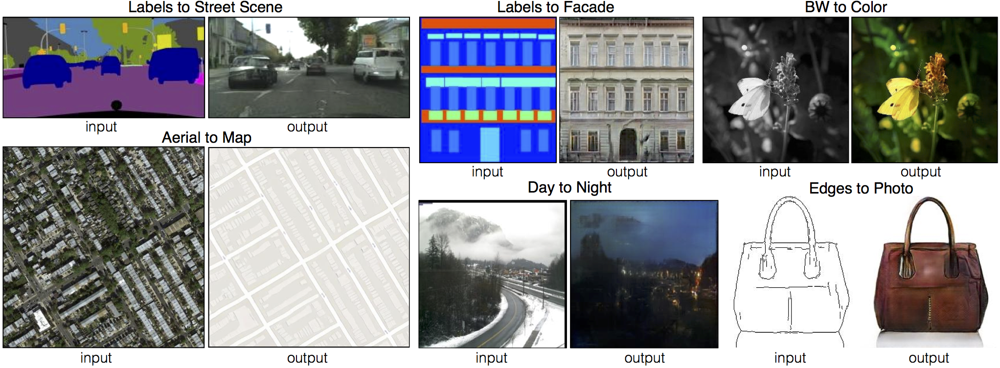

## GAN

A generative adversarial network (GAN) is a machine learning model in which two neural networks (generator and discriminator) compete with each other by using deep learning methods to become more accurate in their predictions.The goal of the generator is to artificially manufacture outputs that could easily be mistaken for real data. The goal of the discriminator is to identify which of the outputs it receives have been artificially created.

Generative Adversarial Networks (GANs) can be broken down into three parts:


*   Generative: To learn a generative model, which describes how data is generated
in terms of a probabilistic model.
*   Adversarial: The word adversarial refers to setting one thing up against another. This means that, in the context of GANs, the generative result is compared with the actual images in the data set. A mechanism known as a discriminator is used to apply a model that attempts to distinguish between real and fake images.
*  Networks: Use deep neural networks as artificial intelligence (AI) algorithms for training purposes.

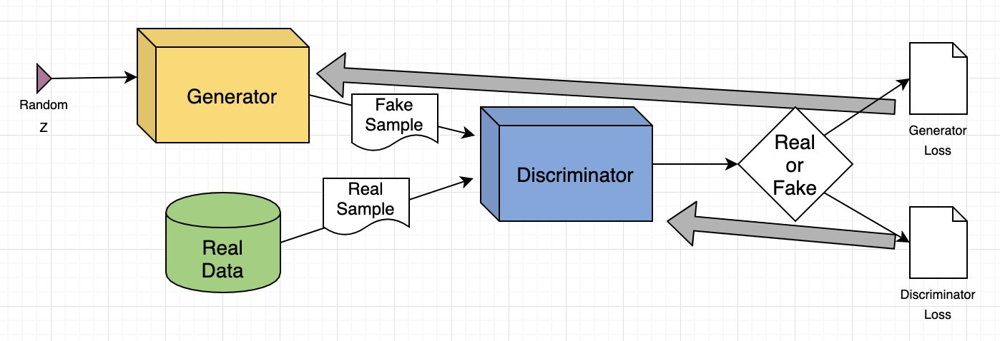

**Types of GANs**

GANs come in a variety of forms and can be used for various tasks. The following are the most common GAN types:


*   Vanilla GAN. This is the simplest of all GANs and its algorithm tries to optimize the mathematical equation using stochastic gradient descent, which is a method of learning an entire data set by going through one example at a time. It consists of a generator and a discriminator. The classification and creation of generated images is done using the generators and discriminators as straightforward multi-layer perceptrons. The discriminator seeks to determine the likelihood that the input belongs to a particular class while the generator collects the distribution of the data.
*   Conditional GAN. By applying class labels, this kind of GAN enables the conditioning of the network with new and specific information. As a result, during GAN training, the network receives the images with their actual labels, such as "rose," "sunflower" or "tulip" to help it learn how to distinguish between them.
*   Deep convolutional GAN. This GAN uses a deep convolutional neural network for producing high-resolution image generation that can be differentiated. Convolutions are a technique for drawing out important information from the generated data. They function particularly well with images, enabling the network to quickly absorb the essential details.
*   CycleGAN. This is the most common GAN architecture and is generally used to learn how to transform between images of various styles. For instance, a network can be taught how to alter an image from winter to summer or from an image of a horse to a zebra. One of the most well-known applications of CycleGAN is FaceApp, which alters human faces into various age groups.
*   StyleGAN. Researchers from Nvidia released StyleGAN in December 2018 and proposed significant improvements to the original generator architecture models. StyleGAN can produce photorealistic, high-quality photos of faces, but users can modify the model to alter the appearance of the images that are produced.
*   Super resolution GAN. With this type of GAN, a low-resolution image can be changed into a more detailed one. Super-resolution GANs increase the image resolution by filling in blurry spots.

[[ref]](https://www.techtarget.com/searchenterpriseai/definition/generative-adversarial-network-GAN)

**Network architectures**

For generator we use a “**U-Net**”-based
architecture and for discriminator we use a convolutional “**PatchGAN**” classifier, which only penalizes structure at the scale of image patches.

U-Net was originally invented and first used for biomedical image segmentation. Its architecture can be broadly thought of as an encoder network followed by a decoder network. Unlike classification where the end result of the the deep network is the only important thing, semantic segmentation not only requires discrimination at pixel level but also a mechanism to project the discriminative features learnt at different stages of the encoder onto the pixel space.

[[ref]](https://developers.arcgis.com/python/guide/how-unet-works/)

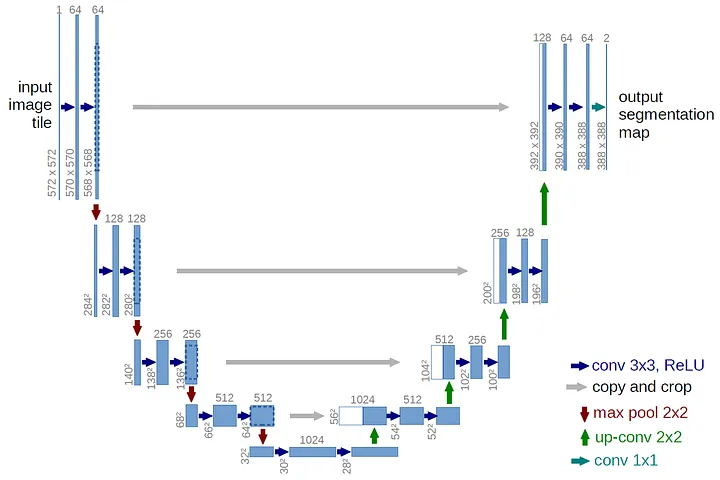

The discriminator network uses the PatchGAN network. Instead of predicting the whole image as fake or real at the discriminator, the model takes a N*N patch image and predicts every pixel in that patch if its real or fake. The authors reason that this enforces more constraints that encourage sharp high-frequency detail. Additionally, the PatchGAN has fewer parameters and runs faster than classifying the entire image.

[[ref]](https://ai.plainenglish.io/understanding-pix2pix-gan-e21c2bedd213)

**Loss function**

In Image translation task, the GAN training scheme is almost the same as the original GAN, except now we have conditional input and an additional L1 loss to ensure the generated image is not too different from the expected output.

*   GAN Loss

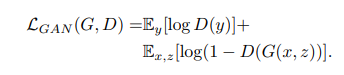

Just like original GAN, optimizing this Loss will forces the Generator to produce results with overall distribution close to that of the image representation in the dataset and thus improve the structural quality of the Generator's output.

*   L1 Loss

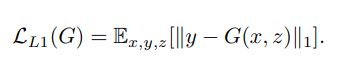

 By using pixel-wise loss between 2 images, this loss forces the output image to be as close to the expected output as possible. In other words, it improves the minor details of the output.
*   Final Loss

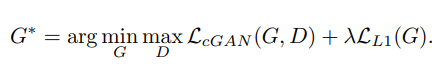

We simply combine GAN loss and L1 Loss to have the final Loss for the entire algorithm.

[[ref]](https://github.com/anh-nn01/Satellite-Imagery-to-Map-Translation-using-Pix2Pix-GAN-framework)

## Satellite aerial image to map image

In [ ]:
from numpy import zeros
from numpy import ones
from numpy.random import randint
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from tensorflow.keras.layers import Input
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import Dropout
from keras.layers import BatchNormalization
from matplotlib import pyplot as plt
from tensorflow.keras.utils import plot_model
from os import listdir
from numpy import asarray, load
from numpy import vstack
from numpy import savez_compressed
from matplotlib import pyplot
import numpy as np
from keras.models import load_model
from keras.callbacks import ModelCheckpoint
from keras.preprocessing.image import load_img, img_to_array
from google.colab import drive
from datetime import datetime
from PIL import Image
import os

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Discriminator**

Inputs:


*   in_src_image: Input image (source image) that we want to convert or transform.
*   in_target_image: Target image (the desired output after transformation).

Architecture:


*   The input images are concatenated channel-wise.
*   Several convolutional layers with LeakyReLU activation functions are used to extract features from the concatenated images.
*   Batch normalization is applied after some convolutional layers to stabilize and speed up training.
*   The number of filters in the convolutional layers increases progressively (64, 128, 256, 512).
*   The output layer produces a patch-level output with a sigmoid activation function, indicating the probability of each patch being real.
*   The number of convolutional layers and filters can be adjusted based on the specific task and dataset. In this implementation, there are five convolutional layers.

Compilation:

*   The model is compiled using the Adam optimizer with a learning rate of 0.0002 and a momentum term (beta_1) of 0.5.
*   Binary cross-entropy is used as the loss function, which is typical for discriminator models in GANs.
*   The loss for the discriminator is weighted by 50% for each model update. This weighting is often used to balance the training process between the generator and discriminator.

In [ ]:
def define_discriminator(image_shape):

	# weight initialization
	init = RandomNormal(stddev=0.02) #As described in the original paper

	# source image input
	in_src_image = Input(shape=image_shape)  #Image we want to convert to another image
	# target image input
	in_target_image = Input(shape=image_shape)  #Image we want to generate after training.

	# concatenate images, channel-wise
	merged = Concatenate()([in_src_image, in_target_image])

	# C64: 4x4 kernel Stride 2x2
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	# C128: 4x4 kernel Stride 2x2
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C256: 4x4 kernel Stride 2x2
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C512: 4x4 kernel Stride 2x2
    # Not in the original paper. Comment this block if you want.
	d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# second last output layer : 4x4 kernel but Stride 1x1
	d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# patch output
	d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
	patch_out = Activation('sigmoid')(d)
	# define model
	model = Model([in_src_image, in_target_image], patch_out)
	# compile model
    #The model is trained with a batch size of one image and Adam opt.
    #with a small learning rate and 0.5 beta.
    #The loss for the discriminator is weighted by 50% for each model update.

	opt = Adam(learning_rate=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
	return model

**Encoder block for a generator**

Inputs:

*   layer_in: Input tensor representing the feature maps from the previous layer.
*   n_filters: Number of filters (channels) in the convolutional layer.
*   batchnorm: A boolean indicating whether to apply batch normalization after the convolutional layer.


Architecture:

*   The function adds a convolutional layer (Conv2D) with a kernel size of (4,4) and a stride of (2,2) for downsampling the feature maps.
*   Batch normalization is optionally applied after the convolutional layer, which can help stabilize and accelerate training by normalizing the activations.
*   Leaky ReLU activation with a small negative slope (alpha=0.2) is applied to introduce non-linearity


Output:

*   The output of the encoder block is the processed feature maps, which are downsampled in spatial dimensions and potentially increased in the number of channels






In [ ]:
def define_encoder_block(layer_in, n_filters, batchnorm=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add downsampling layer
	g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	# conditionally add batch normalization
	if batchnorm:
		g = BatchNormalization()(g, training=True)
	# leaky relu activation
	g = LeakyReLU(alpha=0.2)(g)
	return g

**Decoder block for a generator**

Inputs:

*   layer_in: Input tensor representing the feature maps from the previous layer in the decoder.
*   skip_in: Skip connection tensor from the corresponding encoder block.
*   n_filters: Number of filters (channels) in the convolutional layers.
*   dropout: A boolean indicating whether to apply dropout regularization after the convolutional layer.

Architecture:

*   The function adds a transposed convolutional layer (Conv2DTranspose) with a kernel size of (4,4) and a stride of (2,2) for upsampling the feature maps.
*   Batch normalization is applied after the transposed convolutional layer to stabilize and accelerate training.
*   Dropout regularization is optionally applied after batch normalization to prevent overfitting. Dropout randomly sets a fraction of input units to zero during training.
*   The upsampled feature maps are concatenated with the skip connection from the corresponding encoder block.
*   ReLU activation is applied to introduce non-linearity.

Output:

*   The output of the decoder block is the processed feature maps, which are upsampled and merged with skip connections

In [ ]:
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add upsampling layer
	g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	# add batch normalization
	g = BatchNormalization()(g, training=True)
	# conditionally add dropout
	if dropout:
		g = Dropout(0.5)(g, training=True)
	# merge with skip connection
	g = Concatenate()([g, skip_in])
	# relu activation
	g = Activation('relu')(g)
	return g

**Generator**

Inputs:

*   image_shape: The shape of the input images. Default is set to (256, 256, 3), indicating images of size 256x256 pixels with three color channels (RGB).

Encoder:

*   The function defines an encoder part, which consists of several encoder blocks (define_encoder_block) that progressively downsample the input image to extract features.
*   Each encoder block increases the number of filters (channels) and reduces the spatial dimensions of the feature maps.

Bottleneck:

*   After the encoder blocks, a bottleneck layer is introduced. This layer typically has a large number of filters and is responsible for capturing high-level features.

Decoder:

*   The decoder part of the network consists of several decoder blocks (decoder_block), each of which performs upsampling and merges skip connections from the corresponding encoder blocks.
*   Each decoder block reduces the number of filters and increases the spatial dimensions of the feature maps.

Output:

*   The output of the decoder part is fed into a transposed convolutional layer (Conv2DTranspose) to generate the output image that has the same shape as the input image (except for the number of channels, which matches the number of channels in the input_shapes parameter).
*   The output is passed through a hyperbolic tangent activation function (tanh), scaling the pixel values to the range [-1, 1].

In [ ]:
def define_generator(image_shape=(256,256,3)):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# image input
	in_image = Input(shape=image_shape)
	# encoder model: C64-C128-C256-C512-C512-C512-C512-C512
	e1 = define_encoder_block(in_image, 64, batchnorm=False)
	e2 = define_encoder_block(e1, 128)
	e3 = define_encoder_block(e2, 256)
	e4 = define_encoder_block(e3, 512)
	e5 = define_encoder_block(e4, 512)
	e6 = define_encoder_block(e5, 512)
	e7 = define_encoder_block(e6, 512)
	# bottleneck, no batch norm and relu
	b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
	b = Activation('relu')(b)
	# decoder model: CD512-CD512-CD512-C512-C256-C128-C64
	d1 = decoder_block(b, e7, 512)
	d2 = decoder_block(d1, e6, 512)
	d3 = decoder_block(d2, e5, 512)
	d4 = decoder_block(d3, e4, 512, dropout=False)
	d5 = decoder_block(d4, e3, 256, dropout=False)
	d6 = decoder_block(d5, e2, 128, dropout=False)
	d7 = decoder_block(d6, e1, 64, dropout=False)
	# output
	g = Conv2DTranspose(image_shape[2], (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7) #Modified
	out_image = Activation('tanh')(g)  #Generates images in the range -1 to 1. So change inputs also to -1 to 1
	# define model
	model = Model(in_image, out_image)
	return model

**GAN**

Discriminator Weight Freezing:

*   Loop iterates over all layers in the discriminator model. It sets all layers except the BatchNormalization layers to be non-trainable. This means that during training of the composite GAN model, only the BatchNormalization layers in the discriminator will have trainable weights. The purpose of freezing the weights in the discriminator during GAN training is to prevent the discriminator from being overly dominant and to allow the generator to learn more effectively.

Inputs:

*   in_src: Input tensor representing the source image (the image to be transformed or modified).

Generator Output:

*   The source image (in_src) is passed through the generator (g_model) to produce the generated output image (gen_out).

Discriminator Output:

*   Both the source image (in_src) and the generated image (gen_out) are provided as inputs to the discriminator (d_model).
*   The discriminator outputs a prediction (dis_out) indicating the likelihood of each input being real or fake.

Model Definition:

*   The composite GAN model takes the source image as input (in_src) and outputs both the discriminator's prediction (dis_out) and the generated image (gen_out).

Compilation:

*   The model is compiled using the Adam optimizer with a learning rate of 0.0002 and a momentum term (beta_1) of 0.5.
*   Two loss functions are specified: binary cross-entropy (binary_crossentropy) for the adversarial loss (to train the discriminator to distinguish between real and fake images) and mean absolute error (mae) for the L1 loss (to encourage the generated images to be close to the target images).
*   The loss for the adversarial component is weighted more heavily (loss_weights=[1, 100]) compared to the L1 loss, as suggested by the authors of the model. This weighting helps balance the contributions of the two components to the overall loss.


In [ ]:
def define_gan(g_model, d_model, image_shape):
	# make weights in the discriminator not trainable
	for layer in d_model.layers:
		if not isinstance(layer, BatchNormalization):
			layer.trainable = False       #Descriminator layers set to untrainable in the combined GAN but
                                                #standalone descriminator will be trainable.

	# define the source image
	in_src = Input(shape=image_shape)
	# suppy the image as input to the generator
	gen_out = g_model(in_src)
	# supply the input image and generated image as inputs to the discriminator
	dis_out = d_model([in_src, gen_out])
	# src image as input, generated image and disc. output as outputs
	model = Model(in_src, [dis_out, gen_out])
	# compile model
	opt = Adam(learning_rate=0.0002, beta_1=0.5)

    #Total loss is the weighted sum of adversarial loss (BCE) and L1 loss (MAE)
    #Authors suggested weighting BCE vs L1 as 1:100.
	model.compile(loss=['binary_crossentropy', 'mae'],
               optimizer=opt, loss_weights=[1,100])
	return model

**Generate real samples**

Function for providing batches of real samples along with their corresponding labels, which are used to train the discriminator to distinguish between real and fake images.

In [ ]:
def generate_real_samples(dataset, n_samples, patch_shape):
	# unpack dataset
	trainA, trainB = dataset
	# choose random instances
	ix = randint(0, trainA.shape[0], n_samples)
	# retrieve selected images
	X1, X2 = trainA[ix], trainB[ix]
	# generate 'real' class labels (1)
	y = ones((n_samples, patch_shape, patch_shape, 1))
	return [X1, X2], y

**Generate fake samples**

Function serves to generate batches of fake samples using the generator model. These fake samples, along with their corresponding labels, are then used during training to update the discriminator and generator in a GAN framework.

In [ ]:
def generate_fake_samples(g_model, samples, patch_shape):
	# generate fake instance
	X = g_model.predict(samples)
	# create 'fake' class labels (0)
	y = zeros((len(X), patch_shape, patch_shape, 1))
	return X, y

**Summarize performance**

Function provides a visual summary of the generator's performance by showing real source images, generated target images, and real target images. It also saves the generator model for later use or further training.

In [ ]:
def summarize_performance(step, g_model, dataset, n_samples=3):
	# select a sample of input images
	[X_realA, X_realB], _ = generate_real_samples(dataset, n_samples, 1)
	# generate a batch of fake samples
	X_fakeB, _ = generate_fake_samples(g_model, X_realA, 1)
	# scale all pixels from [-1,1] to [0,1]
	X_realA = (X_realA + 1) / 2.0
	X_realB = (X_realB + 1) / 2.0
	X_fakeB = (X_fakeB + 1) / 2.0
	# plot real source images
	for i in range(n_samples):
		plt.subplot(3, n_samples, 1 + i)
		plt.axis('off')
		plt.imshow(X_realA[i])
	# plot generated target image
	for i in range(n_samples):
		plt.subplot(3, n_samples, 1 + n_samples + i)
		plt.axis('off')
		plt.imshow(X_fakeB[i])
	# plot real target image
	for i in range(n_samples):
		plt.subplot(3, n_samples, 1 + n_samples*2 + i)
		plt.axis('off')
		plt.imshow(X_realB[i])
	# save plot to file
	filename1 = 'plot_%06d.png' % (step+1)
	plt.savefig(filename1)
	plt.close()
	# save the generator model
	filename2 = 'model_%06d.h5' % (step+1)
	g_model.save(filename2)
	print('>Saved: %s and %s' % (filename1, filename2))


**Training**

Initialization:

*   Determine the output patch shape of the discriminator (n_patch), which is used for creating the "real" and "fake" labels.
*   Unpack the dataset into trainA and trainB.
*   Calculate the number of batches per training epoch (bat_per_epo) based on the batch size (n_batch) and the size of the training dataset.
*   Calculate the total number of training iterations (n_steps) based on the number of epochs (n_epochs) and the number of batches per epoch.

Training Loop:



*   Iterate over each training step (i) up to the total number of steps (n_steps).
*   For each step, select a batch of real samples (X_realA, X_realB) and generate corresponding fake samples (X_fakeB) using the generator model (g_model).
*   Update the discriminator twice:
  1.   using real samples ([X_realA, X_realB]) with the "real" labels (y_real)
  2.   using real samples (X_realA) and fake samples (X_fakeB) with the "fake" labels (y_fake)

*   Update the generator using the combined GAN model (gan_model) by providing real samples (X_realA) and expecting the discriminator to output "real" labels (y_real) and the corresponding real target images (X_realB).

Logging:

*   Print the discriminator and generator losses for each step to monitor the training progress.
*   Call the summarize_performance function periodically to visualize and save the performance of the generator model.

In [ ]:
# train pix2pix models
def train(d_model, g_model, gan_model, dataset, n_epochs=100, n_batch=1):
	# determine the output square shape of the discriminator
	n_patch = d_model.output_shape[1]
	# unpack dataset
	trainA, trainB = dataset
	# calculate the number of batches per training epoch
	bat_per_epo = int(len(trainA) / n_batch)
	# calculate the number of training iterations
	n_steps = bat_per_epo * n_epochs
	# manually enumerate epochs
	for i in range(n_steps):
		# select a batch of real samples
		[X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
		# generate a batch of fake samples
		X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
		# update discriminator for real samples
		d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
		# update discriminator for generated samples
		d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
		# update the generator
		g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])
		# summarize performance
		print('>%d, d1[%.3f] d2[%.3f] g[%.3f]' % (i+1, d_loss1, d_loss2, g_loss))
		# summarize model performance
		if (i+1) % (bat_per_epo * 10) == 0:
			summarize_performance(i, g_model, dataset)


**Load and preprocess images**

*   Convert the loaded image to a NumPy array using img_to_array from the same module.
*   Split the image array into two parts: the satellite image (sat_img) and the corresponding map image (map_img), assuming the image is horizontally concatenated.
*   Append the satellite and map images to their respective lists (src_list for satellite images and tar_list for map images).
*   Each array has a shape (n_images, height, width, channels).



In [ ]:
def load_images(path, size=(256, 512)):
    src_list, tar_list = list(), list()
    # enumerate filenames in directory, assume all are images
    for filename in listdir(path):
        # load and resize the image
        pixels = load_img(path + filename, target_size=size)
        # convert to numpy array
        pixels = img_to_array(pixels)
        # split into satellite and map
        sat_img, map_img = pixels[:, :256], pixels[:, 256:]
        src_list.append(sat_img)
        tar_list.append(map_img)
    return [asarray(src_list), asarray(tar_list)]

In [ ]:
google_drive_path = '/content/drive/MyDrive/maps/train/'
[src_images, tar_images] = load_images(google_drive_path)
print('Loaded:', src_images.shape, tar_images.shape)

Loaded: (1096, 256, 256, 3) (1096, 256, 256, 3)


In [ ]:
google_drive_path = '/content/drive/MyDrive/maps/val/'
[src_imagesT, tar_imagesT] = load_images(google_drive_path)
print('Loaded:', src_imagesT.shape, tar_imagesT.shape)

Loaded: (1098, 256, 256, 3) (1098, 256, 256, 3)


Visual representation of a sample of source and target image pairs, verification of the dataset's content and quality.

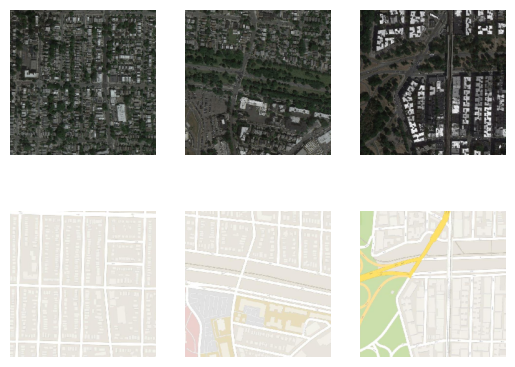

In [ ]:
n_samples = 3
for i in range(n_samples):
	pyplot.subplot(2, n_samples, 1 + i)
	pyplot.axis('off')
	pyplot.imshow(src_images[i].astype('uint8'))
# plot target image
for i in range(n_samples):
	pyplot.subplot(2, n_samples, 1 + n_samples + i)
	pyplot.axis('off')
	pyplot.imshow(tar_images[i].astype('uint8'))
pyplot.show()


Define the discriminator model (d_model), the generator model (g_model), and the composite GAN model (gan_model) based on the loaded dataset.

In [ ]:
# define input shape based on the loaded dataset
image_shape = src_images.shape[1:]
# define the models
d_model = define_discriminator(image_shape)
g_model = define_generator(image_shape)
# define the composite model
gan_model = define_gan(g_model, d_model, image_shape)

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Prepare the training dataset by scaling the pixel values of the source and target images to the range [-1, 1].

In [ ]:
#Define data
# load and prepare training images
data = [src_images, tar_images]

def preprocess_data(data):
	# load compressed arrays
	# unpack arrays
	X1, X2 = data[0], data[1]
	# scale from [0,255] to [-1,1]
	X1 = (X1 - 127.5) / 127.5
	X2 = (X2 - 127.5) / 127.5
	return [X1, X2]

dataset = preprocess_data(data)

**Train** model for 10 epochs.

In [ ]:
start1 = datetime.now()

train(d_model, g_model, gan_model, dataset, n_epochs=10, n_batch=1) #for better results increase number of epochs
#Reports parameters for each batch (total 1096) for each epoch.
#For 10 epochs we should see 10960

stop1 = datetime.now()
#Execution time of the model
execution_time = stop1-start1
print("Execution time is: ", execution_time)

Izlaz streaminga skraćen je na ovoliko posljednjih redaka: 5000.
1/1 [==============================] - 0s 19ms/step
>8462, d1[0.255] d2[0.370] g[8.186]
1/1 [==============================] - 0s 22ms/step
>8463, d1[0.193] d2[0.227] g[10.841]
1/1 [==============================] - 0s 22ms/step
>8464, d1[0.652] d2[0.242] g[3.762]
1/1 [==============================] - 0s 22ms/step
>8465, d1[0.139] d2[0.349] g[6.267]
1/1 [==============================] - 0s 20ms/step
>8466, d1[0.483] d2[0.294] g[4.296]
1/1 [==============================] - 0s 24ms/step
>8467, d1[0.132] d2[0.320] g[6.520]
1/1 [==============================] - 0s 22ms/step
>8468, d1[0.112] d2[0.243] g[6.763]
1/1 [==============================] - 0s 21ms/step
>8469, d1[0.132] d2[0.198] g[12.735]
1/1 [==============================] - 0s 18ms/step
>8470, d1[0.653] d2[0.244] g[5.214]
1/1 [==============================] - 0s 18ms/step
>8471, d1[0.106] d2[0.295] g[6.902]
1/1 [==============================] - 0s 23ms/step
>

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


>Saved: plot_010960.png and model_010960.h5
Execution time is:  0:44:02.442085


In [ ]:
model = load_model('/content/drive/MyDrive/model_010960.h5')

In [ ]:
start1 = datetime.now()

train(d_model, g_model, gan_model, dataset, n_epochs=25, n_batch=1)
#Reports parameters for each batch (total 1096) for each epoch.
#For 25 epochs we should see 27400

stop1 = datetime.now()
execution_time = stop1-start1
print("Execution time is: ", execution_time)

Streaming output truncated to the last 5000 lines.
>8461, d1[0.183] d2[0.050] g[10.794]
1/1 [==============================] - 0s 22ms/step
>8462, d1[0.388] d2[0.646] g[8.722]
1/1 [==============================] - 0s 23ms/step
>8463, d1[0.083] d2[0.297] g[10.025]
1/1 [==============================] - 0s 22ms/step
>8464, d1[0.016] d2[0.087] g[12.227]
1/1 [==============================] - 0s 28ms/step
>8465, d1[0.231] d2[0.041] g[11.456]
1/1 [==============================] - 0s 23ms/step
>8466, d1[0.744] d2[0.186] g[7.388]
1/1 [==============================] - 0s 27ms/step
>8467, d1[0.399] d2[0.571] g[7.207]
1/1 [==============================] - 0s 23ms/step
>8468, d1[0.136] d2[0.230] g[8.771]
1/1 [==============================] - 0s 24ms/step
>8469, d1[0.046] d2[0.060] g[8.806]
1/1 [==============================] - 0s 28ms/step
>8470, d1[0.843] d2[0.103] g[7.817]
1/1 [==============================] - 0s 29ms/step
>8471, d1[0.008] d2[0.123] g[14.126]
1/1 [=======================

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Izlaz streaminga skraćen je na ovoliko posljednjih redaka: 5000.
1/1 [==============================] - 0s 27ms/step
>19422, d1[0.465] d2[0.165] g[6.778]
1/1 [==============================] - 0s 37ms/step
>19423, d1[0.161] d2[0.587] g[6.611]
1/1 [==============================] - 0s 34ms/step
>19424, d1[0.331] d2[0.207] g[5.677]
1/1 [==============================] - 0s 33ms/step
>19425, d1[0.157] d2[0.276] g[8.560]
1/1 [==============================] - 0s 37ms/step
>19426, d1[0.442] d2[0.540] g[5.770]
1/1 [==============================] - 0s 32ms/step
>19427, d1[0.075] d2[0.156] g[14.253]
1/1 [==============================] - 0s 34ms/step
>19428, d1[0.648] d2[0.224] g[6.529]
1/1 [==============================] - 0s 33ms/step
>19429, d1[0.498] d2[0.347] g[6.041]
1/1 [==============================] - 0s 42ms/step
>19430, d1[0.254] d2[0.172] g[6.659]
1/1 [==============================] - 0s 37ms/step
>19431, d1[0.119] d2[0.243] g[11.048]
1/1 [==============================] - 0s 2

Izlaz streaminga skraćen je na ovoliko posljednjih redaka: 5000.
>24901, d1[0.276] d2[0.288] g[5.645]
1/1 [==============================] - 0s 38ms/step
>24902, d1[0.207] d2[0.443] g[5.813]
1/1 [==============================] - 0s 30ms/step
>24903, d1[0.511] d2[0.213] g[5.521]
1/1 [==============================] - 0s 43ms/step
>24904, d1[0.505] d2[0.218] g[5.412]
1/1 [==============================] - 0s 34ms/step
>24905, d1[0.546] d2[0.212] g[4.803]
1/1 [==============================] - 0s 33ms/step
>24906, d1[0.405] d2[0.235] g[5.671]
1/1 [==============================] - 0s 49ms/step
>24907, d1[0.439] d2[0.320] g[3.340]
1/1 [==============================] - 0s 35ms/step
>24908, d1[0.129] d2[0.292] g[5.875]
1/1 [==============================] - 0s 37ms/step
>24909, d1[0.131] d2[0.267] g[6.658]
1/1 [==============================] - 0s 39ms/step
>24910, d1[0.132] d2[0.591] g[5.945]
1/1 [==============================] - 0s 39ms/step
>24911, d1[0.465] d2[0.226] g[6.706]
1/1 [===

In [ ]:
model25 = load_model('/content/drive/MyDrive/maps/model_021920.h5')

**Plot images**

Visually compare the source, generated, and target images forfor qualitative evaluation of the model's performance

In [ ]:
def plot_images(src_img, gen_img, gen_img2, tar_img, labels):
    images = vstack((src_img, gen_img, gen_img2, tar_img))
    # scale from [-1,1] to [0,1]
    images = (images + 1) / 2.0
    titles = ['Source', labels[0], labels[1], 'Expected']
    # plot images in two rows
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 10))
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i])
        ax.set_title(titles[i])
        ax.axis('off')
    plt.tight_layout()
    plt.show()

1/1 [==============================] - 1s 649ms/step


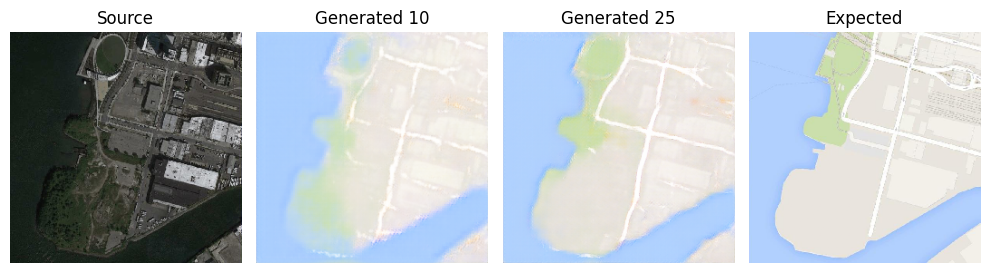

In [ ]:
[X1, X2] = dataset
# select random example
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]
# generate image from source
gen_image = model.predict(src_image)
gen_image2 = model25.predict(src_image)
# plot all three images
plot_images(src_image, gen_image, gen_image2, tar_image, ['Generated 10', 'Generated 25'])

In [ ]:
dataT = [src_imagesT, tar_imagesT]
datasetT = preprocess_data(dataT)

1/1 [==============================] - 0s 23ms/step


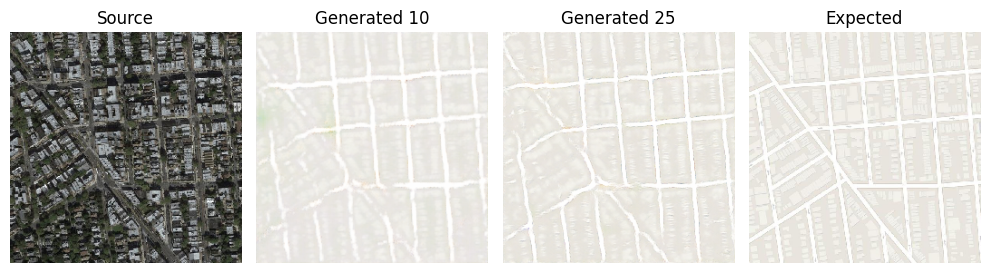

In [ ]:
[X1, X2] = datasetT
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]
gen_image = model.predict(src_image)
gen_image2 = model25.predict(src_image)
plot_images(src_image, gen_image, gen_image2, tar_image, ['Generated 10', 'Generated 25'])

Model prediction for new image.

In [ ]:
def load_and_preprocess_image(image_path, target_size=(256, 512)):
    img = load_img(image_path, target_size=target_size)
    img_array = img_to_array(img)
    img_array = (img_array - 127.5) / 127.5  # Normalize to the range [-1, 1]
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return img_array

1/1 [==============================] - 1s 643ms/step


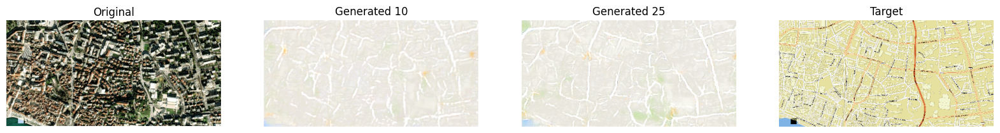

In [ ]:
new_image_path = '/content/drive/MyDrive/maps/splitTest/satelliteSplit.png'
new_image = load_and_preprocess_image(new_image_path)

# Generate an image using the trained model
generated_image = model.predict(new_image)
generated_image2 = model25.predict(new_image)

# Rescale generated image from [-1, 1] to [0, 1] for visualization
generated_image = (generated_image + 1) / 2.0
generated_image2 = (generated_image2 + 1) / 2.0

plt.figure(figsize=(20, 15))

# Visualize the original, generated, and target images
plt.subplot(1, 4, 1)
plt.imshow(np.squeeze(load_img(new_image_path)))
plt.title('Original')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(np.squeeze(generated_image))
plt.title('Generated 10')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(np.squeeze(generated_image2))
plt.title('Generated 25')
plt.axis('off')

# Load and visualize the target image
target_image_path = '/content/drive/MyDrive/maps/splitTest/mapSplit.png'
target_image = load_and_preprocess_image(target_image_path)
plt.subplot(1, 4, 4)
plt.imshow(np.squeeze(target_image))
plt.title('Target')
plt.axis('off')

plt.show()


### Changing hyperparameters

Change discriminator: Remove one Conv layer (C512: 4x4 kernel Stride 2x2) and increase learning rate.

In [ ]:
def define_discriminator(image_shape):

	# weight initialization
	init = RandomNormal(stddev=0.02) #As described in the original paper

	# source image input
	in_src_image = Input(shape=image_shape)  #Image we want to convert to another image
	# target image input
	in_target_image = Input(shape=image_shape)  #Image we want to generate after training.

	# concatenate images, channel-wise
	merged = Concatenate()([in_src_image, in_target_image])

	# C64: 4x4 kernel Stride 2x2
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	# C256: 4x4 kernel Stride 2x2
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# second last output layer : 4x4 kernel but Stride 1x1
	d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# patch output
	d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
	patch_out = Activation('sigmoid')(d)
	# define model
	model = Model([in_src_image, in_target_image], patch_out)

	opt = Adam(learning_rate=0.001, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
	return model

In [ ]:
train(d_model, g_model, gan_model, dataset, n_epochs=10, n_batch=1)

Izlaz streaminga skraćen je na ovoliko posljednjih redaka: 5000.
1/1 [==============================] - 0s 20ms/step
>8462, d1[0.127] d2[0.124] g[10.264]
1/1 [==============================] - 0s 20ms/step
>8463, d1[0.463] d2[0.237] g[7.343]
1/1 [==============================] - 0s 21ms/step
>8464, d1[0.060] d2[0.318] g[12.432]
1/1 [==============================] - 0s 21ms/step
>8465, d1[0.059] d2[0.187] g[11.971]
1/1 [==============================] - 0s 24ms/step
>8466, d1[0.214] d2[0.225] g[8.823]
1/1 [==============================] - 0s 21ms/step
>8467, d1[0.209] d2[0.148] g[7.877]
1/1 [==============================] - 0s 22ms/step
>8468, d1[0.061] d2[0.205] g[13.935]
1/1 [==============================] - 0s 20ms/step
>8469, d1[0.377] d2[0.156] g[10.918]
1/1 [==============================] - 0s 21ms/step
>8470, d1[0.257] d2[0.277] g[7.294]
1/1 [==============================] - 0s 20ms/step
>8471, d1[0.215] d2[0.270] g[8.464]
1/1 [==============================] - 0s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


>Saved: plot_010960.png and model_010960.h5


In [ ]:
modelD = load_model('/content/drive/MyDrive/maps/model_disc.h5')

1/1 [==============================] - 0s 340ms/step


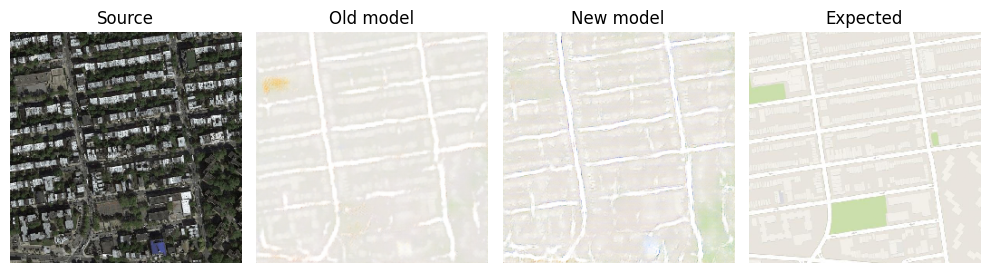

In [ ]:
[X1, X2] = datasetT
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]
gen_image = model.predict(src_image)
gen_image2 = modelD.predict(src_image)
plot_images(src_image, gen_image, gen_image2, tar_image, ['Old model', 'New model'])

Change batch size

In [ ]:
train(d_model, g_model, gan_model, dataset, n_epochs=10, n_batch=5)

In [ ]:
modelB = load_model('/content/drive/MyDrive/maps/model5batch.h5')

1/1 [==============================] - 0s 350ms/step


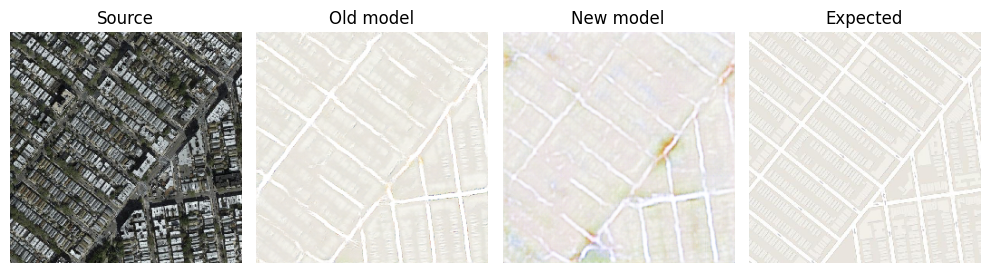

In [ ]:
[X1, X2] = datasetT
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]
gen_image = model25.predict(src_image)
gen_image2 = modelB.predict(src_image)
plot_images(src_image, gen_image, gen_image2, tar_image, ['Old model', 'New model'])

Change learning rate and beta


In [ ]:
def define_gan(g_model, d_model, image_shape):
	# make weights in the discriminator not trainable
	for layer in d_model.layers:
		if not isinstance(layer, BatchNormalization):
			layer.trainable = False       #Descriminator layers set to untrainable in the combined GAN but
                                                #standalone descriminator will be trainable.

	# define the source image
	in_src = Input(shape=image_shape)
	# suppy the image as input to the generator
	gen_out = g_model(in_src)
	# supply the input image and generated image as inputs to the discriminator
	dis_out = d_model([in_src, gen_out])
	# src image as input, generated image and disc. output as outputs
	model = Model(in_src, [dis_out, gen_out])
	# compile model
	opt = Adam(learning_rate=0.0009, beta_1=0.6) #?????????????

	model.compile(loss=['binary_crossentropy', 'mae'],
               optimizer=opt, loss_weights=[1,100])
	return model

In [ ]:
train(d_model, g_model, gan_model, dataset, n_epochs=10, n_batch=1)

In [ ]:
modelG = load_model('/content/drive/MyDrive/maps/model_test.h5')

1/1 [==============================] - 1s 650ms/step


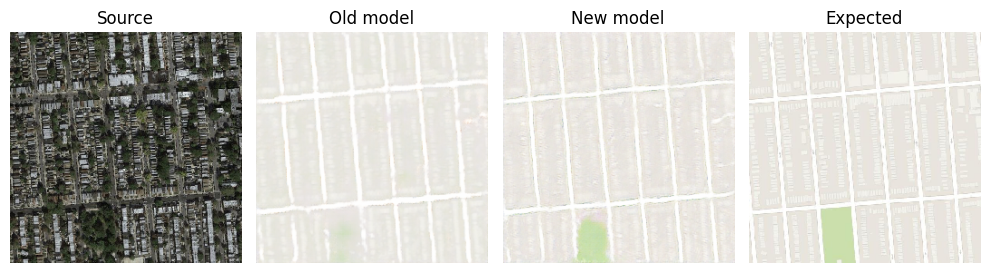

In [ ]:
[X1, X2] = datasetT
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]
gen_image = model.predict(src_image)
gen_image2 = modelG.predict(src_image)
plot_images(src_image, gen_image, gen_image2, tar_image, ['Old model', 'New model'])

### Map to Aerial

In [ ]:
def generate_real_samples(dataset, n_samples, patch_shape):
	# unpack dataset
	trainA, trainB = dataset
	# choose random instances
	ix = randint(0, trainA.shape[0], n_samples)
	# retrieve selected images
	X1, X2 = trainA[ix], trainB[ix]
	# generate 'real' class labels (1)
	y = ones((n_samples, patch_shape, patch_shape, 1))
	return [X2, X1], y

In [ ]:
start1 = datetime.now()

train(d_model, g_model, gan_model, dataset, n_epochs=10, n_batch=1)
stop1 = datetime.now()
#Execution time of the model
execution_time = stop1-start1
print("Execution time is: ", execution_time)

Izlaz streaminga skraćen je na ovoliko posljednjih redaka: 5000.
1/1 [==============================] - 0s 19ms/step
>8462, d1[0.562] d2[0.292] g[6.040]
1/1 [==============================] - 0s 20ms/step
>8463, d1[0.033] d2[0.048] g[22.907]
1/1 [==============================] - 0s 24ms/step
>8464, d1[0.050] d2[0.063] g[22.488]
1/1 [==============================] - 0s 24ms/step
>8465, d1[0.037] d2[0.158] g[16.808]
1/1 [==============================] - 0s 25ms/step
>8466, d1[0.400] d2[0.145] g[21.350]
1/1 [==============================] - 0s 25ms/step
>8467, d1[0.006] d2[1.638] g[26.954]
1/1 [==============================] - 0s 28ms/step
>8468, d1[0.040] d2[0.036] g[23.429]
1/1 [==============================] - 0s 31ms/step
>8469, d1[0.370] d2[0.036] g[25.081]
1/1 [==============================] - 0s 28ms/step
>8470, d1[0.035] d2[0.142] g[22.856]
1/1 [==============================] - 0s 27ms/step
>8471, d1[0.043] d2[0.060] g[24.333]
1/1 [==============================] - 0s 31ms

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


>Saved: plot_010960.png and model_010960.h5
Execution time is:  0:45:18.926141


In [ ]:
modelAerial = load_model('/content/drive/MyDrive/maps/model_map_to_aerial.h5')

In [ ]:
def plotAerial(src_img, gen_img, tar_img):
    images = vstack((tar_img, gen_img, src_img))
    # scale from [-1,1] to [0,1]
    images = (images + 1) / 2.0
    titles = ['Source','Generated','Expected']
    # plot images in two rows
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 10))
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i])
        ax.set_title(titles[i])
        ax.axis('off')
    plt.tight_layout()
    plt.show()

1/1 [==============================] - 0s 20ms/step


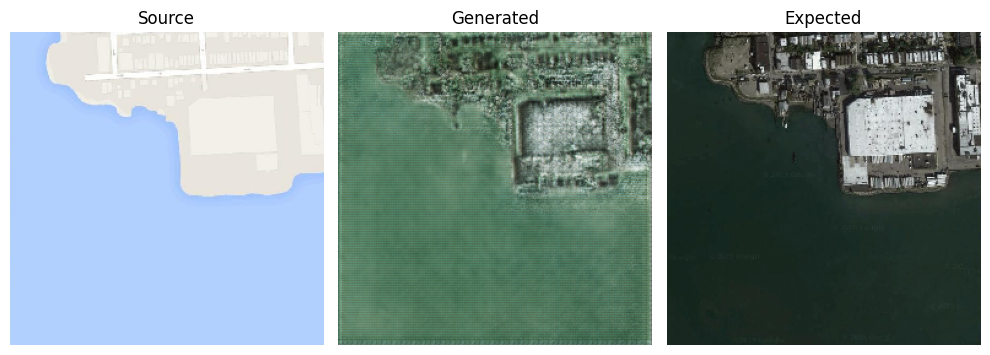

In [ ]:
[X1, X2] = dataset
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]
gen_image = modelAerial.predict(src_image)
plotAerial(src_image, gen_image, tar_image)

### Continue training with new dataset

*   Load pretrained model and define hyperparameters.
*   Load and preprocess new dataset.
*   Compile the model.
*   Train the model.



In [ ]:
pretrained_model = model

In [ ]:
learning_rate = 0.0002
beta_1 = 0.5
batch_size = 1
epochs = 10

In [ ]:
def resize_and_save_images(input_dir, output_dir, new_size):
    """
    Resize images from input_dir to square images and save them to output_dir.

    Args:
    - input_dir (str): Path to the directory containing input images.
    - output_dir (str): Path to the directory where resized images will be saved.
    - new_size (int): The size of the square to resize the images to.

    Returns:
    - None
    """

    # Create the output directory if it doesn't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Iterate through all files in the input directory
    for filename in os.listdir(input_dir):
        if filename.endswith(('.jpg', '.jpeg', '.png')):  # Filter only image files
            input_path = os.path.join(input_dir, filename)
            output_path = os.path.join(output_dir, filename)

            # Open image using PIL
            image = Image.open(input_path)

            # Get dimensions of the original image
            width, height = image.size

            # Find the center of the image
            center_x = width // 2
            center_y = height // 2

            # Calculate the cropping boundaries
            left = max(0, center_x - min(width, height) // 2)
            upper = max(0, center_y - min(width, height) // 2)
            right = min(width, center_x + min(width, height) // 2)
            lower = min(height, center_y + min(width, height) // 2)

            # Crop the center part of the image
            cropped_image = image.crop((left, upper, right, lower))

            # Resize the cropped image to a square
            resized_image = cropped_image.resize((new_size, new_size), Image.ANTIALIAS)

            # Save the resized image
            resized_image.save(output_path)

            print(f"Resized and saved: {output_path}")

input_directory = "/content/drive/MyDrive/maps/custom"
output_directory = "/content/drive/MyDrive/maps/custom_new"
new_size = 604

#resize_and_save_images(input_directory, output_directory, new_size)


In [ ]:
input_directory = "/content/drive/MyDrive/maps/splitTest"
output_directory = "/content/drive/MyDrive/maps/splitTest_new"
new_size = 604

#resize_and_save_images(input_directory, output_directory, new_size)

In [ ]:
def load_and_preprocess_dataset(path, size=(256, 256)):
    src_images, tar_images = [], []
    for i in range(1, 21):
        # Load satellite image
        sat_img = img_to_array(load_img(f"{path}/s{i}.png", target_size=size))
        # Load corresponding map image
        map_img = img_to_array(load_img(f"{path}/m{i}.png", target_size=size))
        src_images.append(sat_img)
        tar_images.append(map_img)
    return asarray(src_images), asarray(tar_images)

In [ ]:
# Load and preprocess the dataset
dataset_path = "/content/drive/MyDrive/maps/custom_new"
src_images, tar_images = load_and_preprocess_dataset(dataset_path)

pretrained_model.compile(optimizer=Adam(learning_rate=learning_rate, beta_1=beta_1), loss='binary_crossentropy')

In [ ]:
# Define checkpoints to save the best model during training
checkpoint_path = "/content/drive/MyDrive/maps/"
checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=True)

In [ ]:
pretrained_model.fit(src_images, tar_images, batch_size=batch_size, epochs=epochs)

Epoch 1/10
20/20 [==============================] - 27s 996ms/step - loss: -3368.3171
Epoch 2/10
20/20 [==============================] - 20s 1s/step - loss: -3471.1887
Epoch 3/10
20/20 [==============================] - 20s 993ms/step - loss: -3477.3125
Epoch 4/10
20/20 [==============================] - 20s 994ms/step - loss: -3478.7312
Epoch 5/10
20/20 [==============================] - 21s 1s/step - loss: -3479.2227
Epoch 6/10
20/20 [==============================] - 20s 1s/step - loss: -3479.4551
Epoch 7/10
20/20 [==============================] - 23s 1s/step - loss: -3479.7039
Epoch 8/10
20/20 [==============================] - 22s 1s/step - loss: -3479.7883
Epoch 9/10
20/20 [==============================] - 20s 1s/step - loss: -3479.8335
Epoch 10/10
20/20 [==============================] - 21s 1s/step - loss: -3479.8621


In [ ]:
# Evaluate the fine-tuned model (if needed)
# evaluation_result = pretrained_model.evaluate(test_src_images, test_tar_images)

model_path = "/content/drive/MyDrive/maps/fine_tuned_model25.h5"
pretrained_model.save(model_path)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
new_model_path = "/content/drive/MyDrive/maps/fine_tuned_model25.h5"
new_model = load_model(new_model_path)

*   Plot comparison of old and new model

1/1 [==============================] - 1s 688ms/step


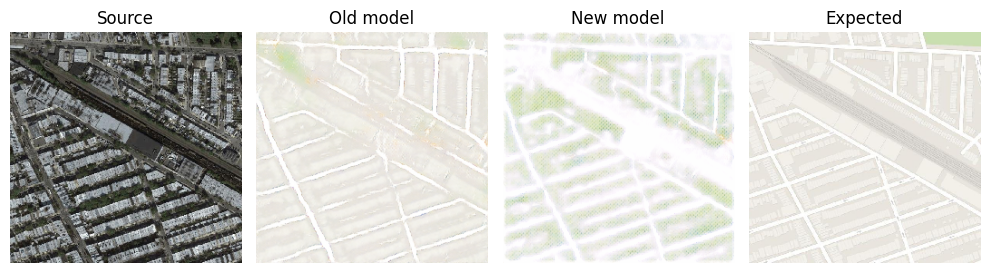

In [ ]:
[X1, X2] = datasetT
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]
gen_image = model25.predict(src_image)
gen_image2 = new_model.predict(src_image)
plot_images(src_image, gen_image, gen_image2, tar_image, ['Old model', 'New model'])

In [ ]:
def load_and_preprocess_image2(image_path, target_size=(256, 256)):
    img = load_img(image_path, target_size=target_size)
    img_array = img_to_array(img)
    img_array = (img_array - 127.5) / 127.5  # Normalize to the range [-1, 1]
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return img_array

1/1 [==============================] - 0s 475ms/step


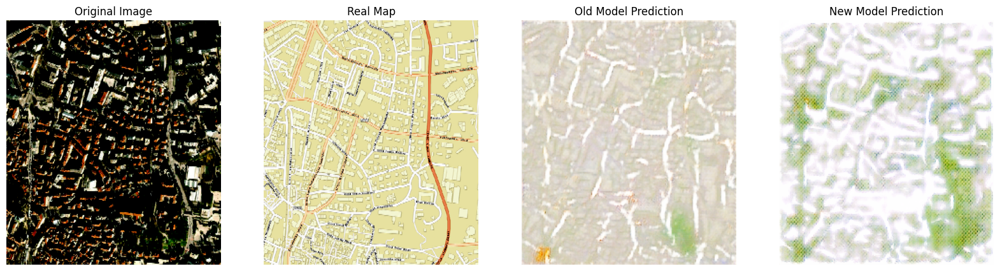

In [ ]:
# Load the test image
new_image_path = '/content/drive/MyDrive/maps/splitTest_new/satelliteSplit.png'
new_image = load_and_preprocess_image2(new_image_path)
target_image_path = '/content/drive/MyDrive/maps/splitTest_new/mapSplit.png'


# Generate predictions using the old model
old_prediction = model.predict(new_image)

# Generate predictions using the fine-tuned model
prediction = new_model.predict(new_image)

# Visualize the original, old model prediction, and new model prediction
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(np.squeeze(load_and_preprocess_image(new_image_path)), aspect='auto')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(np.squeeze(load_and_preprocess_image(target_image_path)), aspect='auto')
plt.title('Real Map')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(np.squeeze(old_prediction), aspect='auto')
plt.title('Old Model Prediction')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(np.squeeze(prediction), aspect='auto')
plt.title('New Model Prediction')
plt.axis('off')

plt.show()


In [ ]:
data2 = [src_images, tar_images]
dataset2 = preprocess_data(data2)

In [ ]:
train(d_model, g_model, gan_model, dataset2, n_epochs=100, n_batch=1)

1/1 [==============================] - 0s 38ms/step
>1, d1[0.436] d2[0.431] g[5.365]
1/1 [==============================] - 0s 43ms/step
>2, d1[0.124] d2[0.156] g[9.518]
1/1 [==============================] - 0s 39ms/step
>3, d1[0.219] d2[0.209] g[12.664]
1/1 [==============================] - 0s 32ms/step
>4, d1[0.347] d2[0.267] g[6.306]
1/1 [==============================] - 0s 39ms/step
>5, d1[0.135] d2[0.163] g[11.103]
1/1 [==============================] - 0s 45ms/step
>6, d1[0.313] d2[0.297] g[7.630]
1/1 [==============================] - 0s 34ms/step
>7, d1[0.261] d2[0.199] g[12.115]
1/1 [==============================] - 0s 41ms/step
>8, d1[0.087] d2[0.100] g[12.589]
1/1 [==============================] - 0s 67ms/step
>9, d1[0.101] d2[0.146] g[12.031]
1/1 [==============================] - 0s 23ms/step
>10, d1[0.386] d2[0.328] g[7.565]
1/1 [==============================] - 0s 58ms/step
>11, d1[0.066] d2[0.080] g[12.842]
1/1 [==============================] - 0s 57ms/step
>12, 

>Saved: plot_000200.png and model_000200.h5
1/1 [==============================] - 0s 26ms/step
>201, d1[0.152] d2[0.125] g[7.994]
1/1 [==============================] - 0s 25ms/step
>202, d1[0.068] d2[0.064] g[12.756]
1/1 [==============================] - 0s 28ms/step
>203, d1[0.105] d2[0.125] g[12.291]
1/1 [==============================] - 0s 25ms/step
>204, d1[0.058] d2[0.115] g[13.031]
1/1 [==============================] - 0s 28ms/step
>205, d1[0.100] d2[0.101] g[12.424]
1/1 [==============================] - 0s 27ms/step
>206, d1[0.306] d2[0.336] g[8.283]
1/1 [==============================] - 0s 49ms/step
>207, d1[0.255] d2[0.134] g[11.189]
1/1 [==============================] - 0s 34ms/step
>208, d1[0.068] d2[0.094] g[12.548]
1/1 [==============================] - 0s 34ms/step
>209, d1[0.176] d2[0.160] g[8.335]
1/1 [==============================] - 0s 33ms/step
>210, d1[0.051] d2[0.153] g[11.506]
1/1 [==============================] - 0s 35ms/step
>211, d1[0.131] d2[0.090] g

>Saved: plot_000400.png and model_000400.h5
1/1 [==============================] - 0s 23ms/step
>401, d1[0.330] d2[0.281] g[6.614]
1/1 [==============================] - 0s 26ms/step
>402, d1[0.051] d2[0.154] g[11.561]
1/1 [==============================] - 0s 25ms/step
>403, d1[0.325] d2[0.317] g[6.883]
1/1 [==============================] - 0s 25ms/step
>404, d1[0.473] d2[0.269] g[7.659]
1/1 [==============================] - 0s 26ms/step
>405, d1[0.117] d2[0.221] g[7.355]
1/1 [==============================] - 0s 24ms/step
>406, d1[0.472] d2[0.133] g[7.191]
1/1 [==============================] - 0s 25ms/step
>407, d1[0.262] d2[0.197] g[6.446]
1/1 [==============================] - 0s 26ms/step
>408, d1[0.012] d2[0.502] g[8.703]
1/1 [==============================] - 0s 24ms/step
>409, d1[0.191] d2[0.039] g[9.948]
1/1 [==============================] - 0s 23ms/step
>410, d1[0.506] d2[0.092] g[8.777]
1/1 [==============================] - 0s 25ms/step
>411, d1[0.008] d2[0.450] g[12.73

>Saved: plot_000600.png and model_000600.h5
1/1 [==============================] - 0s 25ms/step
>601, d1[0.129] d2[0.103] g[7.509]
1/1 [==============================] - 0s 24ms/step
>602, d1[0.386] d2[0.158] g[6.219]
1/1 [==============================] - 0s 27ms/step
>603, d1[0.176] d2[0.332] g[6.893]
1/1 [==============================] - 0s 25ms/step
>604, d1[0.212] d2[0.156] g[6.622]
1/1 [==============================] - 0s 26ms/step
>605, d1[0.048] d2[0.068] g[9.847]
1/1 [==============================] - 0s 28ms/step
>606, d1[0.379] d2[0.226] g[5.293]
1/1 [==============================] - 0s 25ms/step
>607, d1[0.118] d2[0.100] g[10.405]
1/1 [==============================] - 0s 27ms/step
>608, d1[0.058] d2[0.145] g[11.542]
1/1 [==============================] - 0s 30ms/step
>609, d1[0.055] d2[0.158] g[10.714]
1/1 [==============================] - 0s 27ms/step
>610, d1[0.061] d2[0.169] g[10.008]
1/1 [==============================] - 0s 32ms/step
>611, d1[0.543] d2[0.129] g[9.

>Saved: plot_000800.png and model_000800.h5
1/1 [==============================] - 0s 37ms/step
>801, d1[0.128] d2[0.206] g[6.530]
1/1 [==============================] - 0s 35ms/step
>802, d1[0.173] d2[0.188] g[5.437]
1/1 [==============================] - 0s 34ms/step
>803, d1[0.227] d2[0.237] g[4.840]
1/1 [==============================] - 0s 45ms/step
>804, d1[0.168] d2[0.236] g[6.308]
1/1 [==============================] - 0s 38ms/step
>805, d1[0.079] d2[0.078] g[9.947]
1/1 [==============================] - 0s 31ms/step
>806, d1[0.158] d2[0.155] g[8.122]
1/1 [==============================] - 0s 33ms/step
>807, d1[0.080] d2[0.127] g[9.157]
1/1 [==============================] - 0s 29ms/step
>808, d1[0.148] d2[0.172] g[6.125]
1/1 [==============================] - 0s 30ms/step
>809, d1[0.165] d2[0.110] g[9.856]
1/1 [==============================] - 0s 29ms/step
>810, d1[0.072] d2[0.105] g[10.342]
1/1 [==============================] - 0s 30ms/step
>811, d1[0.039] d2[0.175] g[10.55

>Saved: plot_001000.png and model_001000.h5
1/1 [==============================] - 0s 25ms/step
>1001, d1[0.120] d2[0.225] g[5.855]
1/1 [==============================] - 0s 32ms/step
>1002, d1[0.146] d2[0.165] g[5.463]
1/1 [==============================] - 0s 26ms/step
>1003, d1[0.069] d2[0.067] g[9.744]
1/1 [==============================] - 0s 25ms/step
>1004, d1[0.033] d2[0.106] g[9.654]
1/1 [==============================] - 0s 26ms/step
>1005, d1[0.192] d2[0.147] g[8.561]
1/1 [==============================] - 0s 22ms/step
>1006, d1[0.152] d2[0.152] g[7.724]
1/1 [==============================] - 0s 30ms/step
>1007, d1[0.273] d2[0.251] g[5.079]
1/1 [==============================] - 0s 38ms/step
>1008, d1[0.123] d2[0.232] g[5.825]
1/1 [==============================] - 0s 34ms/step
>1009, d1[0.274] d2[0.170] g[5.857]
1/1 [==============================] - 0s 34ms/step
>1010, d1[0.272] d2[0.281] g[4.534]
1/1 [==============================] - 0s 38ms/step
>1011, d1[0.064] d2[0.10

>Saved: plot_001200.png and model_001200.h5
1/1 [==============================] - 0s 23ms/step
>1201, d1[0.269] d2[0.251] g[4.656]
1/1 [==============================] - 0s 24ms/step
>1202, d1[0.073] d2[0.147] g[8.866]
1/1 [==============================] - 0s 26ms/step
>1203, d1[0.154] d2[0.138] g[7.440]
1/1 [==============================] - 0s 27ms/step
>1204, d1[0.198] d2[0.256] g[4.816]
1/1 [==============================] - 0s 25ms/step
>1205, d1[0.210] d2[0.228] g[5.391]
1/1 [==============================] - 0s 27ms/step
>1206, d1[0.153] d2[0.107] g[8.473]
1/1 [==============================] - 0s 26ms/step
>1207, d1[0.142] d2[0.169] g[6.726]
1/1 [==============================] - 0s 27ms/step
>1208, d1[0.130] d2[0.193] g[6.547]
1/1 [==============================] - 0s 26ms/step
>1209, d1[0.072] d2[0.120] g[8.852]
1/1 [==============================] - 0s 25ms/step
>1210, d1[0.216] d2[0.266] g[5.136]
1/1 [==============================] - 0s 26ms/step
>1211, d1[0.206] d2[0.18

>Saved: plot_001400.png and model_001400.h5
1/1 [==============================] - 0s 29ms/step
>1401, d1[0.115] d2[0.136] g[7.249]
1/1 [==============================] - 0s 24ms/step
>1402, d1[0.236] d2[0.148] g[7.115]
1/1 [==============================] - 0s 26ms/step
>1403, d1[0.059] d2[0.201] g[7.219]
1/1 [==============================] - 0s 22ms/step
>1404, d1[0.309] d2[0.254] g[4.718]
1/1 [==============================] - 0s 28ms/step
>1405, d1[0.262] d2[0.245] g[5.074]
1/1 [==============================] - 0s 26ms/step
>1406, d1[0.085] d2[0.098] g[8.253]
1/1 [==============================] - 0s 26ms/step
>1407, d1[0.161] d2[0.151] g[6.648]
1/1 [==============================] - 0s 26ms/step
>1408, d1[0.245] d2[0.226] g[4.579]
1/1 [==============================] - 0s 24ms/step
>1409, d1[0.139] d2[0.195] g[6.211]
1/1 [==============================] - 0s 22ms/step
>1410, d1[0.073] d2[0.182] g[6.742]
1/1 [==============================] - 0s 31ms/step
>1411, d1[0.134] d2[0.16

>Saved: plot_001600.png and model_001600.h5
1/1 [==============================] - 0s 24ms/step
>1601, d1[0.092] d2[0.153] g[7.497]
1/1 [==============================] - 0s 25ms/step
>1602, d1[0.200] d2[0.257] g[4.188]
1/1 [==============================] - 0s 24ms/step
>1603, d1[0.124] d2[0.179] g[7.020]
1/1 [==============================] - 0s 24ms/step
>1604, d1[0.214] d2[0.198] g[4.957]
1/1 [==============================] - 0s 29ms/step
>1605, d1[0.281] d2[0.232] g[4.265]
1/1 [==============================] - 0s 29ms/step
>1606, d1[0.100] d2[0.136] g[6.595]
1/1 [==============================] - 0s 26ms/step
>1607, d1[0.114] d2[0.159] g[6.878]
1/1 [==============================] - 0s 23ms/step
>1608, d1[0.220] d2[0.221] g[5.296]
1/1 [==============================] - 0s 24ms/step
>1609, d1[0.181] d2[0.257] g[4.060]
1/1 [==============================] - 0s 28ms/step
>1610, d1[0.150] d2[0.167] g[5.981]
1/1 [==============================] - 0s 29ms/step
>1611, d1[0.176] d2[0.23

>Saved: plot_001800.png and model_001800.h5
1/1 [==============================] - 0s 25ms/step
>1801, d1[0.232] d2[0.253] g[4.547]
1/1 [==============================] - 0s 31ms/step
>1802, d1[0.297] d2[0.321] g[3.620]
1/1 [==============================] - 0s 41ms/step
>1803, d1[0.146] d2[0.200] g[6.057]
1/1 [==============================] - 0s 23ms/step
>1804, d1[0.214] d2[0.243] g[5.180]
1/1 [==============================] - 0s 27ms/step
>1805, d1[0.114] d2[0.161] g[7.066]
1/1 [==============================] - 0s 26ms/step
>1806, d1[0.213] d2[0.292] g[4.187]
1/1 [==============================] - 0s 27ms/step
>1807, d1[0.130] d2[0.152] g[6.480]
1/1 [==============================] - 0s 30ms/step
>1808, d1[0.145] d2[0.134] g[7.804]
1/1 [==============================] - 0s 27ms/step
>1809, d1[0.124] d2[0.214] g[5.880]
1/1 [==============================] - 0s 25ms/step
>1810, d1[0.242] d2[0.279] g[5.090]
1/1 [==============================] - 0s 31ms/step
>1811, d1[0.216] d2[0.28

>Saved: plot_002000.png and model_002000.h5


In [ ]:
modelSplit = load_model('/content/drive/MyDrive/maps/model_tr.h5')

1/1 [==============================] - 0s 23ms/step


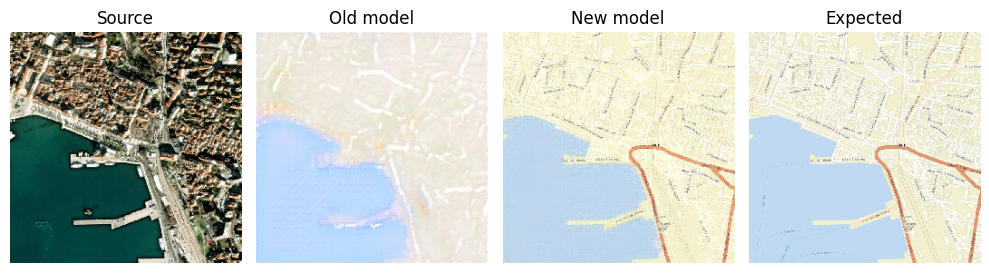

In [ ]:
[X1, X2] = dataset2
# select random example
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]
# generate image from source
gen_image = model.predict(src_image)
gen_image2 = modelSplit.predict(src_image)
# plot all three images
plot_images(src_image, gen_image, gen_image2, tar_image, ['Old model', 'New model'])

1/1 [==============================] - 0s 192ms/step


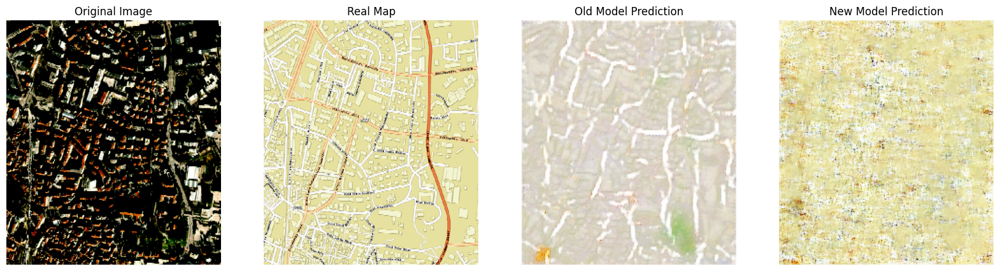

In [ ]:
# Load the test image
new_image_path = '/content/drive/MyDrive/maps/splitTest_new/satelliteSplit.png'
new_image = load_and_preprocess_image2(new_image_path)
target_image_path = '/content/drive/MyDrive/maps/splitTest_new/mapSplit.png'


# Generate predictions using the old model
old_prediction = model.predict(new_image)

# Generate predictions using the fine-tuned model
fine_tuned_prediction = modelSplit.predict(new_image)

# Visualize the original, old model prediction, and fine-tuned model prediction
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(np.squeeze(load_and_preprocess_image(new_image_path)), aspect='auto')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(np.squeeze(load_and_preprocess_image(target_image_path)), aspect='auto')
plt.title('Real Map')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(np.squeeze(old_prediction), aspect='auto')
plt.title('Old Model Prediction')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(np.squeeze(fine_tuned_prediction), aspect='auto')
plt.title('New Model Prediction')
plt.axis('off')

plt.show()

In [ ]:
modelSplit10 = load_model('/content/drive/MyDrive/maps/model_t.h5')

1/1 [==============================] - 0s 29ms/step


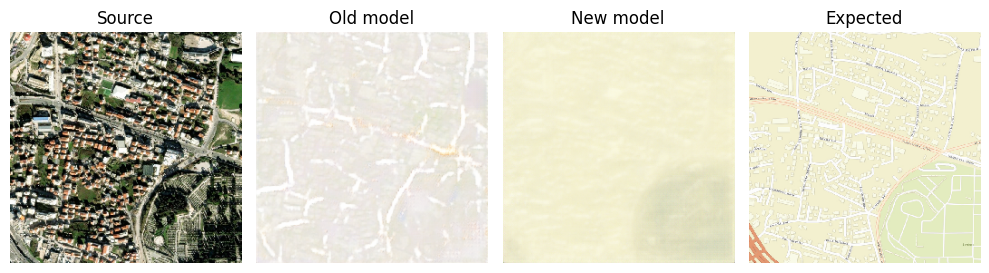

In [ ]:
[X1, X2] = dataset2
# select random example
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]
# generate image from source
gen_image = model.predict(src_image)
gen_image2 = modelSplit10.predict(src_image)
# plot all three images
plot_images(src_image, gen_image, gen_image2, tar_image, ['Old model', 'New model'])

1/1 [==============================] - 0s 25ms/step


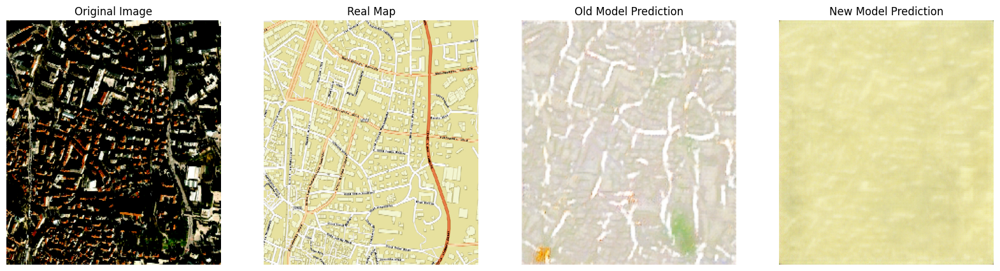

In [ ]:
# Load the test image
new_image_path = '/content/drive/MyDrive/maps/splitTest_new/satelliteSplit.png'
new_image = load_and_preprocess_image2(new_image_path)
target_image_path = '/content/drive/MyDrive/maps/splitTest_new/mapSplit.png'


# Generate predictions using the old model
old_prediction = model.predict(new_image)

# Generate predictions using the fine-tuned model
fine_tuned_prediction = modelSplit10.predict(new_image)

# Visualize the original, old model prediction, and fine-tuned model prediction
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(np.squeeze(load_and_preprocess_image(new_image_path)), aspect='auto')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(np.squeeze(load_and_preprocess_image(target_image_path)), aspect='auto')
plt.title('Real Map')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(np.squeeze(old_prediction), aspect='auto')
plt.title('Old Model Prediction')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(np.squeeze(fine_tuned_prediction), aspect='auto')
plt.title('New Model Prediction')
plt.axis('off')

plt.show()